In [2]:
!git clone https://github.com/neuralcomputer/ML_School.git

fatal: целевой путь «ML_School» уже существует и не является пустым каталогом.


In [3]:
%matplotlib inline
import pandas as pd
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg'

import pandas as pd
df = pd.read_csv('ML_School/Video_Games_Sales_as_at_22_Dec_2016.csv')
df.info()
df = df.dropna()
print("Размер таблицы: ", df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB
Размер табл

In [4]:
df['Year_of_Release'] = df.Year_of_Release.astype('int64') # преобразуем в целое число
df['User_Count'] = df.User_Count.astype('int64') # преобразуем в целое число
df['Critic_Count'] = df.Critic_Count.astype('int64')

df.columns
df.head(5)

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51,8,322,Nintendo,E
2,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73,8.3,709,Nintendo,E
3,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73,8,192,Nintendo,E
6,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65,8.5,431,Nintendo,E
7,Wii Play,Wii,2006,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41,6.6,129,Nintendo,E


In [5]:
useful_cols = [
    'Name', 'Platform', 'Year_of_Release', 'Genre',
    'Global_Sales', 'Critic_Score', 'Critic_Count',
    'User_Score', 'User_Count', 'Rating'
]
df[useful_cols].head()

,Name,Platform,Year_of_Release,Genre,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006,Sports,82.53,76.0,51,8,322,E
2,Mario Kart Wii,Wii,2008,Racing,35.52,82.0,73,8.3,709,E
3,Wii Sports Resort,Wii,2009,Sports,32.77,80.0,73,8,192,E
6,New Super Mario Bros.,DS,2006,Platform,29.80,89.0,65,8.5,431,E
7,Wii Play,Wii,2006,Misc,28.92,58.0,41,6.6,129,E


In [6]:
sales_df = df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']]
sales_df

,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Year_of_Release
0,41.36,28.96,3.77,8.45,82.53,2006
2,15.68,12.76,3.79,3.29,35.52,2008
3,15.61,10.93,3.28,2.95,32.77,2009
6,11.28,9.14,6.50,2.88,29.80,2006
7,13.96,9.18,2.93,2.84,28.92,2006
...,...,...,...,...,...,...
16667,0.01,0.00,0.00,0.00,0.01,2001
16677,0.01,0.00,0.00,0.00,0.01,2002
16696,0.00,0.01,0.00,0.00,0.01,2014
16700,0.01,0.00,0.00,0.00,0.01,2011


In [7]:
summarized_sales_df = sales_df.groupby('Year_of_Release').sum()
summarized_sales_df

,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Year_of_Release,,,,,
1985,0.00,0.03,0.00,0.01,0.03
1988,0.00,0.02,0.00,0.01,0.03
1992,0.02,0.00,0.00,0.00,0.03
1994,0.39,0.26,0.53,0.08,1.27
1996,7.91,6.88,4.06,1.24,20.10
1997,15.34,8.67,9.01,2.02,35.01
1998,18.13,12.13,10.81,2.14,43.18
1999,23.32,15.69,9.67,2.45,51.17
2000,39.34,25.20,11.27,5.49,81.24


<Axes: xlabel='Year_of_Release'>

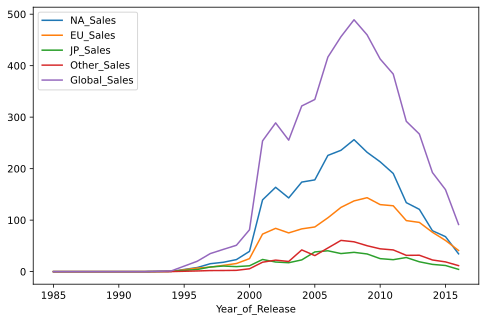

In [8]:
summarized_sales_df.plot()

<Axes: xlabel='Year_of_Release'>

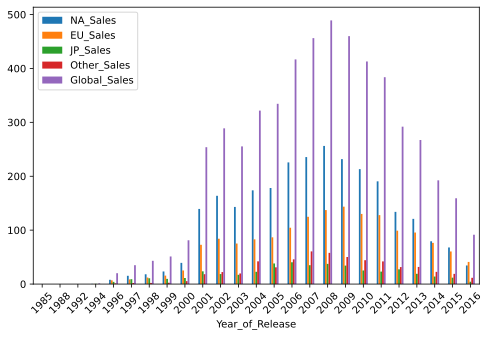

In [9]:
summarized_sales_df.plot(kind='bar', rot=45)

In [10]:
import seaborn as sns

#df = pd.DataFrame({
#    'price': [100, 150, 200, 250, 300],
#    'size': [50, 60, 70, 80, 90], 
#    'rooms': [1, 2, 2, 3, 3],
#    'location': [1, 2, 3, 4, 5]
#})

#sns_figure = sns.pairplot(df)
#sns_figure.savefig('figures/pairplot.png')
#plt.show()

cols = ['Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count']

sns_plot = sns.pairplot(df[cols])

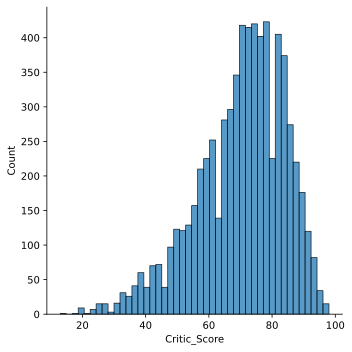

In [11]:
sns.displot(df["Critic_Score"])

<Axes: xlabel='Critic_Score', ylabel='Platform'>

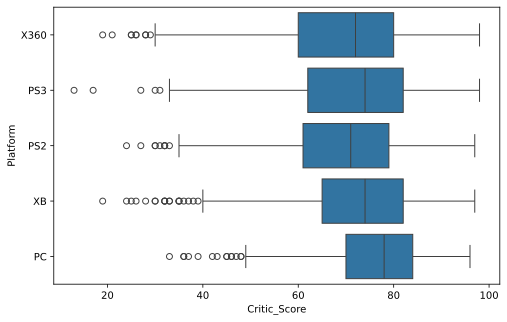

In [12]:
top_platforms = df["Platform"].value_counts().sort_values(ascending=False).head(5).index.values
sns.boxplot(
    y="Platform",
    x="Critic_Score",
    data=df[df["Platform"].isin(top_platforms)],
    orient="h"
)

/var/folders/mj/0hw3ct7s2jg2ktkhzj2rh9n00000gn/T/ipykernel_14568/1104462281.py:1: FutureWarning:

The provided callable <built-in function sum> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.

/var/folders/mj/0hw3ct7s2jg2ktkhzj2rh9n00000gn/T/ipykernel_14568/1104462281.py:1: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



<Axes: xlabel='Genre', ylabel='Platform'>

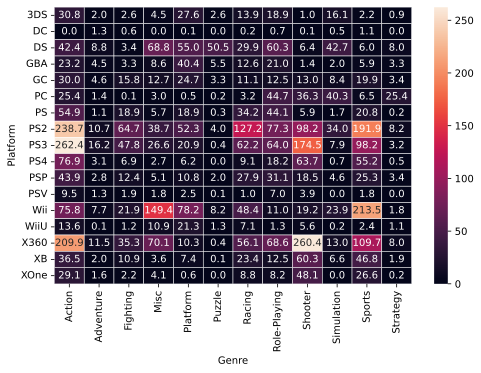

In [13]:
platform_genre_sales = df.pivot_table(
                        index='Platform',
                        columns='Genre',
                        values='Global_Sales',
                        aggfunc=sum).fillna(0).applymap(float)
sns.heatmap(platform_genre_sales, annot=True, fmt=".1f", linewidths=.5)

In [16]:
from plotly.offline import download_plotlyjs, plot, iplot
import plotly.graph_objs as go


years_df = df.groupby('Year_of_Release')[['Global_Sales']].sum().join(
    df.groupby('Year_of_Release')[['Name']].count()
)
years_df.columns = ['Global_Sales', 'Number_of_Games']
years_df

,Global_Sales,Number_of_Games
Year_of_Release,,
1985,0.03,1
1988,0.03,1
1992,0.03,1
1994,1.27,1
1996,20.10,7
1997,35.01,13
1998,43.18,25
1999,51.17,30
2000,81.24,102


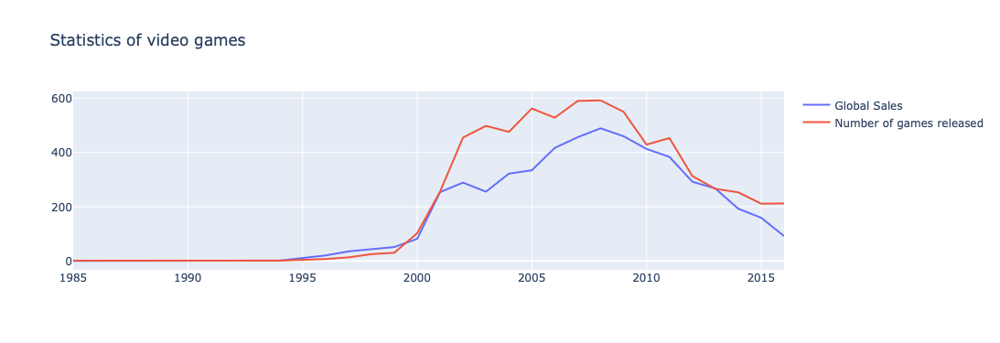

In [22]:
# создаем линию для числа проданных копий
trace0 = go.Scatter(
    x=years_df.index,
    y=years_df.Global_Sales,
    name='Global Sales'
)

# создаем линию для числа вышедших игр
trace1 = go.Scatter(
    x=years_df.index,
    y=years_df.Number_of_Games,
    name='Number of games released'
)
# объединяем графические объекты и задаем title графика в layout
data = [trace0, trace1]
layout = {'title': 'Statistics of video games'}

# cоздаем объект Figure и визуализируем его
fig = go.Figure(data=data, layout=layout)
#fig.show()
iplot(fig, show_link=False) # не показывать ссылку на экспортирование полотна

In [24]:
plot(fig, filename='figures/years_stats.html', show_link=False)

'figures/years_stats.html'